# Optimization in Relation to Problem-Solving

In [2]:
pip install plotly==5.12.0

Note: you may need to restart the kernel to use updated packages.


In [3]:
import pandas as pd
import plotly.express as px
import numpy as np
import matplotlib.pyplot as plt
import os
from mpl_toolkits import mplot3d

from plotly.offline import download_plotlyjs, init_notebook_mode
from plotly.offline import plot, iplot
import plotly.graph_objects as go

In [4]:
path = r'C:\Users\nvak6\Machine Learning with Python'

In [5]:
#Read in the European weather data.
climate = pd.read_csv(os.path.join(path, 'Dataset-weather-prediction-dataset-processed.csv'))
climate

,DATE,MONTH,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,...,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_snow_depth,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,19600101,1,7,2.1,0.85,1.0180,0.32,0.09,0,0.7,...,5,0.88,1.0003,0.45,0.34,0,4.7,8.5,6.0,10.9
1,19600102,1,6,2.1,0.84,1.0180,0.36,1.05,0,1.1,...,7,0.91,1.0007,0.25,0.84,0,0.7,8.9,5.6,12.1
2,19600103,1,8,2.1,0.90,1.0180,0.18,0.30,0,0.0,...,7,0.91,1.0096,0.17,0.08,0,0.1,10.5,8.1,12.9
3,19600104,1,3,2.1,0.92,1.0180,0.58,0.00,0,4.1,...,7,0.86,1.0184,0.13,0.98,0,0.0,7.4,7.3,10.6
4,19600105,1,6,2.1,0.95,1.0180,0.65,0.14,0,5.4,...,3,0.80,1.0328,0.46,0.00,0,5.7,5.7,3.0,8.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,20221027,10,1,2.1,0.79,1.0248,1.34,0.22,0,7.7,...,5,0.82,1.0142,1.13,0.41,0,3.4,10.7,7.9,13.5
22946,20221028,10,6,2.1,0.77,1.0244,1.34,0.22,0,5.4,...,5,0.82,1.0142,1.13,0.41,0,3.4,10.7,7.9,13.5
22947,20221029,10,4,2.1,0.76,1.0227,1.34,0.22,0,6.1,...,5,0.82,1.0142,1.13,0.41,0,3.4,10.7,7.9,13.5
22948,20221030,10,5,2.1,0.80,1.0212,1.34,0.22,0,5.8,...,5,0.82,1.0142,1.13,0.41,0,3.4,10.7,7.9,13.5


In [6]:
#Reduce to just the mean temperatures
df = climate[['DATE', 'MONTH','BASEL_temp_mean',
 'BELGRADE_temp_mean',
 'BUDAPEST_temp_mean',
 'DEBILT_temp_mean',
 'DUSSELDORF_temp_mean',
 'GDANSK_temp_mean',
 'HEATHROW_temp_mean',
 'KASSEL_temp_mean',
 'LJUBLJANA_temp_mean',
 'MAASTRICHT_temp_mean',
 'MADRID_temp_mean',
 'MUNCHENB_temp_mean',
 'OSLO_temp_mean',
 'ROMA_temp_mean',
 'SONNBLICK_temp_mean',
 'STOCKHOLM_temp_mean',
 'TOURS_temp_mean',
 'VALENTIA_temp_mean']].copy()

In [7]:
df

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
0,19600101,1,6.5,3.7,2.4,9.3,10.0,0.8,10.6,7.9,-0.6,9.5,7.6,6.9,4.9,7.8,-5.9,4.2,10.0,8.5
1,19600102,1,6.1,2.9,2.3,7.7,8.2,1.6,6.1,7.7,2.1,8.6,9.8,6.2,3.4,12.2,-9.5,4.0,9.5,8.9
2,19600103,1,8.5,3.1,2.7,6.8,7.1,0.7,8.4,6.5,4.6,6.9,8.6,5.8,1.9,10.2,-9.5,2.4,10.3,10.5
3,19600104,1,6.3,2.0,2.0,6.7,6.8,-0.1,9.4,5.8,3.2,7.0,10.3,3.9,3.0,10.8,-11.5,1.2,11.2,7.4
4,19600105,1,3.0,2.0,2.5,8.0,7.7,0.4,8.9,5.4,3.6,8.1,12.1,1.8,3.7,9.9,-9.3,3.3,11.4,5.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,20221027,10,15.9,18.2,11.7,15.7,17.8,11.5,16.4,9.1,14.7,18.6,20.0,14.3,9.7,15.4,0.6,11.5,19.9,10.7
22946,20221028,10,16.7,15.9,11.7,16.0,19.4,11.7,15.8,9.1,12.9,18.9,19.1,16.1,10.9,15.4,2.3,12.5,20.3,10.7
22947,20221029,10,16.7,13.4,11.7,15.8,18.2,14.2,16.5,9.1,13.2,18.2,19.0,17.4,9.7,15.4,3.3,13.1,20.6,10.7
22948,20221030,10,15.4,15.0,11.7,14.4,16.7,11.0,15.2,9.1,14.0,16.3,15.7,14.5,5.9,15.4,3.4,7.5,15.9,10.7


In [8]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
notemp = df.drop(['DATE','MONTH'], axis=1)

(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18]),
 [Text(1, 0, 'BASEL_temp_mean'),
  Text(2, 0, 'BELGRADE_temp_mean'),
  Text(3, 0, 'BUDAPEST_temp_mean'),
  Text(4, 0, 'DEBILT_temp_mean'),
  Text(5, 0, 'DUSSELDORF_temp_mean'),
  Text(6, 0, 'GDANSK_temp_mean'),
  Text(7, 0, 'HEATHROW_temp_mean'),
  Text(8, 0, 'KASSEL_temp_mean'),
  Text(9, 0, 'LJUBLJANA_temp_mean'),
  Text(10, 0, 'MAASTRICHT_temp_mean'),
  Text(11, 0, 'MADRID_temp_mean'),
  Text(12, 0, 'MUNCHENB_temp_mean'),
  Text(13, 0, 'OSLO_temp_mean'),
  Text(14, 0, 'ROMA_temp_mean'),
  Text(15, 0, 'SONNBLICK_temp_mean'),
  Text(16, 0, 'STOCKHOLM_temp_mean'),
  Text(17, 0, 'TOURS_temp_mean'),
  Text(18, 0, 'VALENTIA_temp_mean')])

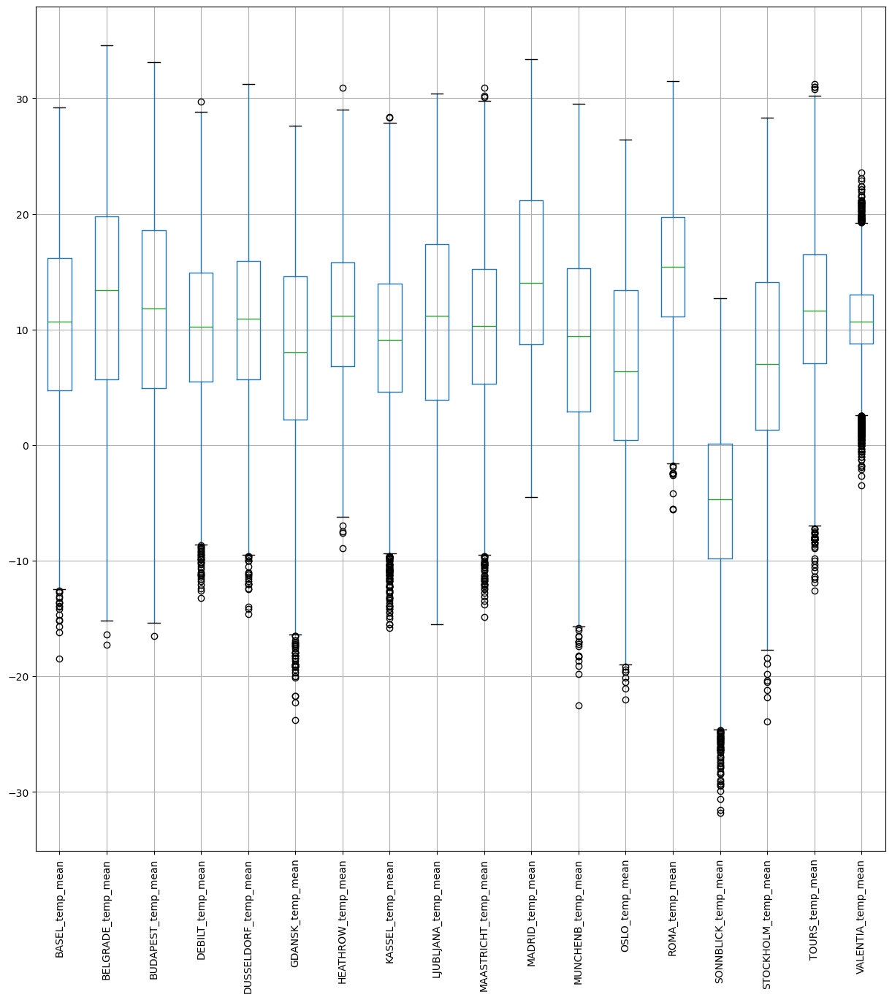

In [9]:
#Look at a whisker plot of the data to see variations in temperatures
notemp.boxplot(figsize=(15,15))
plt.xticks(rotation=90)

## Basel

### 1962

In [12]:
#Reduce your dataset to a single year
dfyear = df[df['DATE'].astype(str).str.contains('1962')]
dfyear

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
731,19620101,1,0.7,12.6,3.1,0.5,-0.9,2.3,-7.0,0.6,4.7,-1.0,12.0,0.5,-4.3,13.8,-6.5,0.2,1.8,2.3
732,19620102,1,-1.8,8.5,2.7,-1.9,-0.9,-1.8,-6.2,-0.8,6.5,-2.0,11.5,-2.6,-8.4,14.9,-7.1,-5.1,-0.1,-0.3
733,19620103,1,-5.3,-0.7,0.2,-2.5,-1.5,0.1,-1.2,-2.6,-1.1,-3.1,9.4,-8.4,-5.4,15.0,-7.6,-2.0,-0.7,0.2
734,19620104,1,-2.6,-2.8,-3.4,0.0,-1.4,0.6,0.7,-0.9,-3.3,-1.5,8.1,-8.6,-5.0,12.5,-7.3,-1.6,0.2,3.0
735,19620105,1,-1.1,-2.4,-4.9,-0.8,-1.4,0.9,3.9,-3.4,-4.8,-1.1,5.7,-5.0,-0.1,10.2,-7.8,2.1,1.0,4.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1091,19621227,12,-13.2,-5.2,-4.2,-2.9,-4.4,-8.6,-2.4,-8.1,-7.3,-5.1,-0.3,-17.0,-8.8,2.6,-19.5,-8.4,-6.4,1.0
1092,19621228,12,-7.6,-7.1,-7.1,-5.9,-4.8,-6.2,-0.2,-7.6,-8.4,-6.1,3.4,-18.7,-11.3,3.2,-17.2,-7.9,-7.0,0.9
1093,19621229,12,-5.6,0.3,-4.7,-6.3,-5.1,-6.1,-1.4,-7.4,-2.2,-7.4,7.5,-10.3,-8.8,11.0,-13.9,-3.3,-1.2,0.1
1094,19621230,12,-0.7,5.3,-0.2,-4.3,-1.2,-5.4,-0.6,-4.6,0.8,-1.7,7.7,-5.1,-11.0,14.1,-7.5,-9.0,4.6,1.5


In [13]:
dfyear.describe()

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
count,3.650000e+02,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000
mean,1.962067e+07,6.526027,8.713699,11.515342,10.535890,8.130685,8.866301,6.733973,9.396712,7.859726,9.011507,8.242192,14.344110,7.215342,4.853425,14.918356,-6.920000,5.733425,8.833973,10.148493
std,3.454755e+02,3.452584,8.091328,9.289270,8.961845,6.088671,6.587667,7.324413,5.637647,7.177330,8.458280,6.432428,7.692636,8.904289,7.677960,7.103324,7.737369,7.241204,5.150109,3.685490
min,1.962010e+07,1.000000,-13.200000,-9.400000,-7.100000,-7.900000,-7.700000,-14.400000,-7.000000,-11.500000,-8.800000,-8.900000,-4.500000,-18.700000,-13.600000,-0.200000,-28.300000,-10.400000,-8.000000,-0.300000
25%,1.962040e+07,4.000000,2.000000,2.900000,2.300000,3.800000,3.800000,1.000000,5.500000,2.600000,1.300000,3.700000,7.600000,0.800000,-1.400000,8.900000,-12.300000,0.000000,5.200000,8.100000
50%,1.962070e+07,7.000000,8.400000,12.300000,11.300000,8.200000,9.400000,7.600000,9.800000,8.100000,9.400000,8.400000,13.700000,7.400000,5.800000,14.900000,-6.700000,6.600000,10.600000,10.200000
75%,1.962100e+07,10.000000,15.500000,19.200000,17.900000,13.200000,14.200000,13.000000,14.400000,13.900000,16.000000,13.600000,21.700000,14.600000,11.700000,21.200000,-1.800000,12.000000,11.600000,13.100000
max,1.962123e+07,12.000000,25.700000,29.500000,28.100000,19.200000,22.100000,21.900000,19.300000,22.100000,25.700000,21.400000,28.000000,25.000000,17.600000,27.600000,8.400000,18.700000,21.400000,17.000000


In [14]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
notempyear = dfyear.drop(['DATE','MONTH'], axis=1)

In [15]:
#Plot ALL weather data for all stations for a year 

#X = weather station
#Y = day of the year
#Z = temperature

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(z=notempyear.values)])
fig.update_layout(title='Temperatures over time', autosize=False,
                  width=600, height=600)
fig.show()

In [16]:
#We need to make an index for the year. Create a set of data from 1 to 365 (or to 366 if it's a leap year!)
#We'll scale this by 100 as the index is made. This will help teh gradient descent converge 366 = 3.66

i = np.arange(0.01,3.66,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
360,3.61
361,3.62
362,3.63
363,3.64


In [17]:
n_rows = dfyear.shape[0]
n_rows

365

In [18]:
X=index.to_numpy().reshape(n_rows,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows,1))
X = np.concatenate((ones, X), axis=1)
y=dfyear['BASEL_temp_mean'].to_numpy().reshape(n_rows,1)

In [19]:
X.shape, y.shape

((365, 2), (365, 1))

In [20]:
#Look at one year of temperature data over time
plt.scatter(x=index['index'], y=dfyear['BASEL_temp_mean']) #<----INSERT WEATHER STATION HERE
plt.xlabel('X'); plt.ylabel('y');
plt.title('Input dataset');

In [21]:
#what is the min temperature? (Note gradient descent is not actually finding this number)
dfyear['BASEL_temp_mean'].min()

-13.2

In [22]:
#what is the max temperature? (Note gradient descent is not actually finding this number)
dfyear['BASEL_temp_mean'].max()

25.7

In [23]:
#This computes the loss function for the gradiant descent. DO NOT CHANGE!

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [24]:
compute_cost(X,y)

array([70.60938356])

In [25]:
#This is the gradiant descent function. DO NOT CHANGE!

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [26]:
%%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=500 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[0],[0]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.05 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: total: 625 ms
Wall time: 707 ms


In [27]:
theta

array([[7.69686444],
       [0.55206134]])

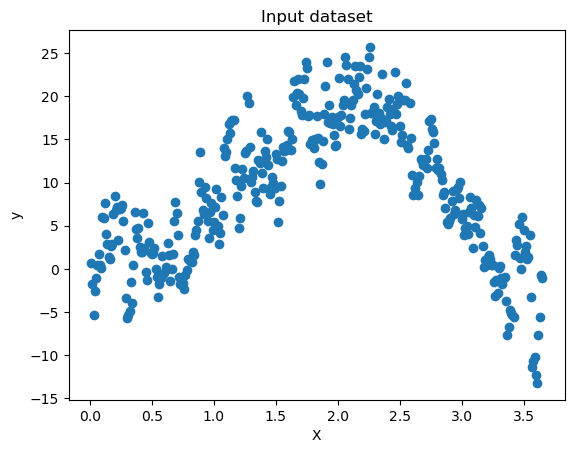

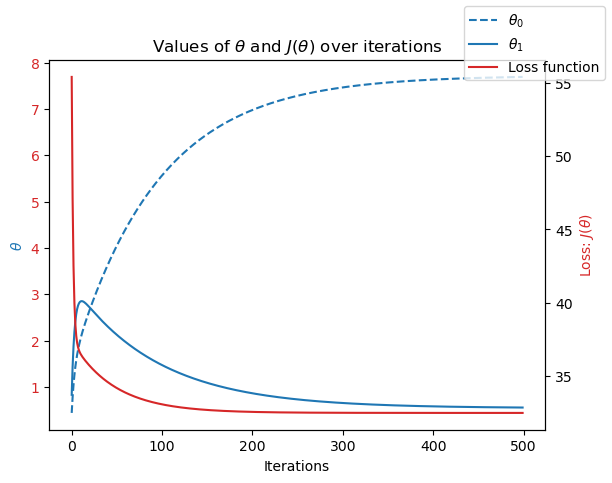

In [28]:
#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();

plt.show()

In [29]:
%%time
# theta range
theta0_vals = np.linspace(-10.02,9.98,100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(-9.82,10.18,100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: total: 3.95 s
Wall time: 4.59 s


In [357]:
#This figure shows the loss function.

#X = Theta0
#Y - Theta1
#Z = Loss
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [31]:
#Here is the same figure as above, with the line the loss function takes toward the minimum.

#X = Theta0
#Y - Theta1
#Z = Loss
#black line = path of loss function over the iterations.
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [32]:
#Rerun the optimization above, but this time start closer to the objective!
#Find where the black line ends near the lowest X/Y/Z coordinate and make that your guess below.

num_iterations=500 #<---start with the same iterations as above
theta_init=np.array([[-.2],[-.2]]) #<---make a guess as to a more accurate [x],[y] coordinates near the minimum in the graph above.
alpha= 0.05 #<---start with the same step size as above
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

In [33]:
#Let's look at the new loss path on the function. It should start much closer to the goal

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history1, y=theta0_history1, z=J_history1, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history1, theta1_history1, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

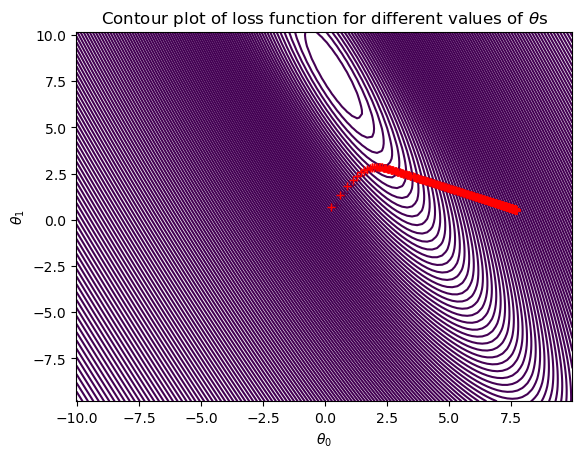

In [34]:
#This plot shows the convergence similar to above, but only in the X/Y plane (there's no height)

plt.contour(theta0_vals, theta1_vals, J_vals, levels = np.logspace(0,10,1000))
plt.xlabel('$\\theta_{0}$'); plt.ylabel("$\\theta_{1}$")
plt.title("Contour plot of loss function for different values of $\\theta$s");
plt.plot(theta0_history1, theta1_history1, 'r+');
plt.show()

### 1990

In [36]:
df2 = climate[['DATE', 'MONTH','BASEL_cloud_cover','BASEL_wind_speed','BASEL_humidity','BASEL_pressure',
               'BASEL_global_radiation','BASEL_precipitation','BASEL_snow_depth','BASEL_sunshine',
               'BASEL_sunshine', 'BASEL_temp_mean', 'BASEL_temp_min','BASEL_temp_max']].copy()

In [37]:
notemp2 = df2.drop(['DATE', 'MONTH'], axis = 1)

In [38]:
notemp2

,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max
0,7,2.1,0.85,1.0180,0.32,0.09,0,0.7,0.7,6.5,0.8,10.9
1,6,2.1,0.84,1.0180,0.36,1.05,0,1.1,1.1,6.1,3.3,10.1
2,8,2.1,0.90,1.0180,0.18,0.30,0,0.0,0.0,8.5,5.1,9.9
3,3,2.1,0.92,1.0180,0.58,0.00,0,4.1,4.1,6.3,3.8,10.6
4,6,2.1,0.95,1.0180,0.65,0.14,0,5.4,5.4,3.0,-0.7,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...
22945,1,2.1,0.79,1.0248,1.34,0.22,0,7.7,7.7,15.9,11.4,21.4
22946,6,2.1,0.77,1.0244,1.34,0.22,0,5.4,5.4,16.7,14.3,21.9
22947,4,2.1,0.76,1.0227,1.34,0.22,0,6.1,6.1,16.7,13.1,22.4
22948,5,2.1,0.80,1.0212,1.34,0.22,0,5.8,5.8,15.4,11.6,21.1


In [39]:
dfyear2 = df2[df2['DATE'].astype(str).str.contains('1990')]
dfyear2

,DATE,MONTH,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max
10958,19900101,1,0,2.1,0.83,1.0217,0.60,0.00,0,7.2,7.2,-2.1,-3.6,1.2
10959,19900102,1,2,2.1,0.84,1.0238,0.48,0.00,0,2.3,2.3,-1.8,-3.9,1.7
10960,19900103,1,8,2.1,0.89,1.0231,0.20,0.00,0,0.0,0.0,-2.2,-4.2,0.4
10961,19900104,1,2,2.1,0.77,1.0265,0.54,0.00,0,5.6,5.6,-0.7,-3.1,2.2
10962,19900105,1,7,2.1,0.81,1.0286,0.23,0.04,0,0.2,0.2,0.0,-3.1,2.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11318,19901227,12,7,6.3,0.72,1.0118,0.34,0.12,0,1.6,1.6,6.6,1.8,10.5
11319,19901228,12,3,2.7,0.71,1.0211,0.60,0.02,0,6.6,6.6,3.8,1.6,6.9
11320,19901229,12,7,4.9,0.70,1.0163,0.16,0.51,0,0.1,0.1,10.3,3.9,15.9
11321,19901230,12,8,3.1,0.74,1.0221,0.12,0.51,0,0.0,0.0,12.0,8.3,15.5


In [40]:
notempyear2 = dfyear2.drop(['DATE','MONTH'], axis=1)

In [41]:
notempyear2

,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max
10958,0,2.1,0.83,1.0217,0.60,0.00,0,7.2,7.2,-2.1,-3.6,1.2
10959,2,2.1,0.84,1.0238,0.48,0.00,0,2.3,2.3,-1.8,-3.9,1.7
10960,8,2.1,0.89,1.0231,0.20,0.00,0,0.0,0.0,-2.2,-4.2,0.4
10961,2,2.1,0.77,1.0265,0.54,0.00,0,5.6,5.6,-0.7,-3.1,2.2
10962,7,2.1,0.81,1.0286,0.23,0.04,0,0.2,0.2,0.0,-3.1,2.6
...,...,...,...,...,...,...,...,...,...,...,...,...
11318,7,6.3,0.72,1.0118,0.34,0.12,0,1.6,1.6,6.6,1.8,10.5
11319,3,2.7,0.71,1.0211,0.60,0.02,0,6.6,6.6,3.8,1.6,6.9
11320,7,4.9,0.70,1.0163,0.16,0.51,0,0.1,0.1,10.3,3.9,15.9
11321,8,3.1,0.74,1.0221,0.12,0.51,0,0.0,0.0,12.0,8.3,15.5


In [42]:
fig = go.Figure(data=[go.Surface(z=notempyear2.values)])
fig.update_layout(title='Temperatures over time', autosize=False,
                  width=600, height=600)
fig.show()

In [43]:
i = np.arange(0.01,3.66,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
360,3.61
361,3.62
362,3.63
363,3.64


In [44]:
n_rows2 = dfyear2.shape[0]
n_rows2

365

In [45]:
X=index.to_numpy().reshape(n_rows2,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows2,1))
X = np.concatenate((ones, X), axis=1)
y=dfyear2['BASEL_temp_mean'].to_numpy().reshape(n_rows2,1)

In [46]:
X.shape, y.shape

((365, 2), (365, 1))

In [47]:
plt.scatter(x=index['index'], y=dfyear2['BASEL_temp_mean']) #<----INSERT WEATHER STATION HERE
plt.xlabel('X'); plt.ylabel('y');
plt.title('Input dataset');

In [48]:
dfyear2['BASEL_temp_mean'].min()

-3.0

In [49]:
dfyear2['BASEL_temp_mean'].max()

25.1

In [50]:
compute_cost(X,y)

array([81.51639726])

In [51]:
%%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=600 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[0],[0]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.05 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: total: 953 ms
Wall time: 1.06 s


In [52]:
theta

array([[9.89658903],
       [0.55449924]])

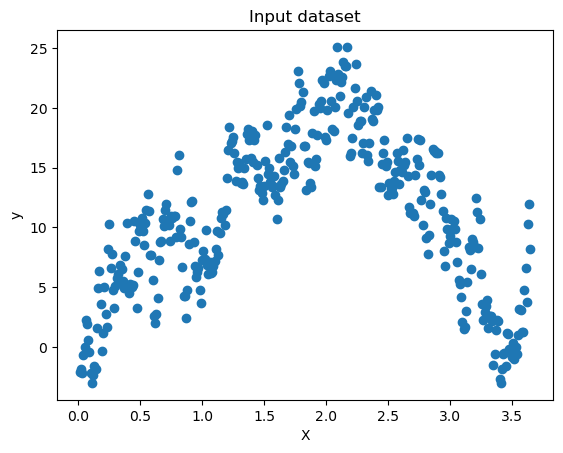

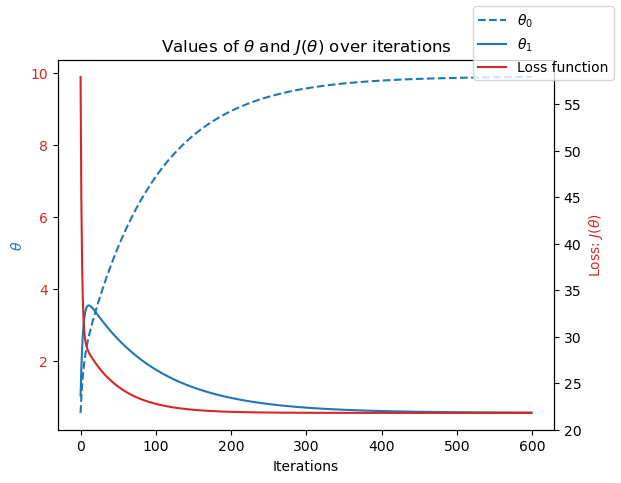

In [53]:
fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();

plt.show()

In [54]:
%%time
# theta range
theta0_vals = np.linspace(-10.06,10.06,100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(-9.92,10.08,100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: total: 4.02 s
Wall time: 4.29 s


In [359]:
fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [56]:
line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

### 2019

In [58]:
df2['DATE'] = pd.to_datetime(df2['DATE'].astype(str), format='%Y%m%d', errors='coerce')

In [59]:
baselyear4 = df2[df2['DATE'].astype(str).str.contains('2019')]
baselyear4

,DATE,MONTH,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max
21550,2019-01-01,1,6,2.5,0.86,1.0333,0.77,0.07,0,0.0,0.0,5.0,1.9,5.9
21551,2019-01-02,1,7,2.0,0.69,1.0357,0.33,0.01,0,0.1,0.1,3.3,0.3,5.3
21552,2019-01-03,1,3,0.8,0.71,1.0393,0.76,0.00,0,5.1,5.1,-0.3,-3.6,2.3
21553,2019-01-04,1,4,1.1,0.79,1.0382,0.74,0.00,0,5.3,5.3,-0.1,-3.5,3.0
21554,2019-01-05,1,8,1.6,0.82,1.0346,0.50,0.04,0,0.0,0.0,2.1,0.4,3.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21910,2019-12-27,12,8,1.5,0.92,1.0273,0.15,0.52,0,0.1,0.1,6.8,5.6,7.9
21911,2019-12-28,12,7,1.9,0.86,1.0380,0.35,0.00,0,1.3,1.3,3.7,-0.6,5.7
21912,2019-12-29,12,6,1.1,0.93,1.0387,0.61,0.00,0,4.9,4.9,-0.8,-2.7,2.6
21913,2019-12-30,12,1,1.8,0.81,1.0354,0.64,0.00,0,6.5,6.5,0.5,-3.0,5.1


In [60]:
baselyear4.describe()

,DATE,MONTH,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max
count,365,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000
mean,2019-07-02 00:00:00,6.526027,5.219178,1.981096,0.722356,1.016973,1.303836,0.215288,0.041096,5.305205,5.305205,11.647945,7.055068,16.521644
min,2019-01-01 00:00:00,1.000000,0.000000,0.600000,0.420000,0.989700,0.130000,0.000000,0.000000,0.000000,0.000000,-1.900000,-5.900000,-1.400000
25%,2019-04-02 00:00:00,4.000000,4.000000,1.300000,0.640000,1.012100,0.460000,0.000000,0.000000,0.700000,0.700000,6.300000,1.500000,9.800000
50%,2019-07-02 00:00:00,7.000000,6.000000,1.700000,0.730000,1.016800,1.070000,0.000000,0.000000,4.500000,4.500000,11.100000,7.000000,16.300000
75%,2019-10-01 00:00:00,10.000000,7.000000,2.300000,0.820000,1.021700,2.070000,0.210000,0.000000,9.200000,9.200000,17.000000,12.000000,23.000000
max,2019-12-31 00:00:00,12.000000,8.000000,6.500000,0.950000,1.039300,3.130000,2.960000,4.000000,15.000000,15.000000,29.100000,22.400000,37.400000
std,NaN,3.452584,2.326664,1.007471,0.119828,0.008814,0.882313,0.465027,0.341231,4.627563,4.627563,7.192562,6.298029,8.548015


In [61]:
notempyear3 = baselyear4.drop(['DATE','MONTH'], axis=1)
notempyear3

,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max
21550,6,2.5,0.86,1.0333,0.77,0.07,0,0.0,0.0,5.0,1.9,5.9
21551,7,2.0,0.69,1.0357,0.33,0.01,0,0.1,0.1,3.3,0.3,5.3
21552,3,0.8,0.71,1.0393,0.76,0.00,0,5.1,5.1,-0.3,-3.6,2.3
21553,4,1.1,0.79,1.0382,0.74,0.00,0,5.3,5.3,-0.1,-3.5,3.0
21554,8,1.6,0.82,1.0346,0.50,0.04,0,0.0,0.0,2.1,0.4,3.5
...,...,...,...,...,...,...,...,...,...,...,...,...
21910,8,1.5,0.92,1.0273,0.15,0.52,0,0.1,0.1,6.8,5.6,7.9
21911,7,1.9,0.86,1.0380,0.35,0.00,0,1.3,1.3,3.7,-0.6,5.7
21912,6,1.1,0.93,1.0387,0.61,0.00,0,4.9,4.9,-0.8,-2.7,2.6
21913,1,1.8,0.81,1.0354,0.64,0.00,0,6.5,6.5,0.5,-3.0,5.1


In [62]:
i = np.arange(0.01,3.66,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
360,3.61
361,3.62
362,3.63
363,3.64


In [63]:
n_rows3 = baselyear4.shape[0]
n_rows3

365

In [64]:
X=index.to_numpy().reshape(n_rows3,1)
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows3,1))
X = np.concatenate((ones, X), axis=1)
y=baselyear4['BASEL_temp_mean'].to_numpy().reshape(n_rows3,1)

In [65]:
plt.scatter(x=index['index'], y=baselyear4['BASEL_temp_mean']) #<----INSERT WEATHER STATION HERE
plt.xlabel('X'); plt.ylabel('y');
plt.title('Input dataset');

In [66]:
baselyear4['BASEL_temp_mean'].min()

-1.9

In [67]:
baselyear4['BASEL_temp_mean'].max()

29.1

In [68]:
compute_cost(X,y)

array([93.63291781])

In [69]:
%%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=500 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[0],[0]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.05 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: total: 1.08 s
Wall time: 1.13 s


In [70]:
theta

array([[8.87296141],
       [1.51243235]])

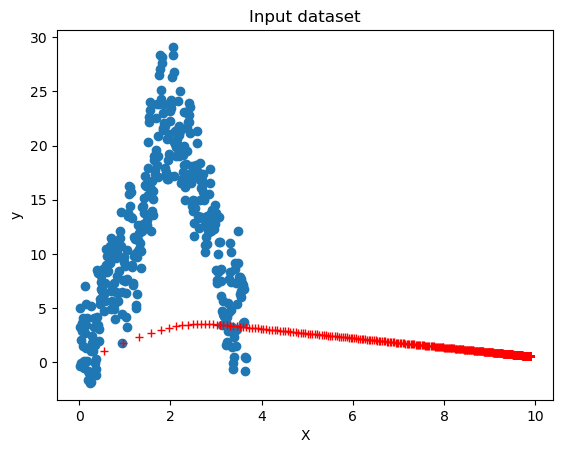

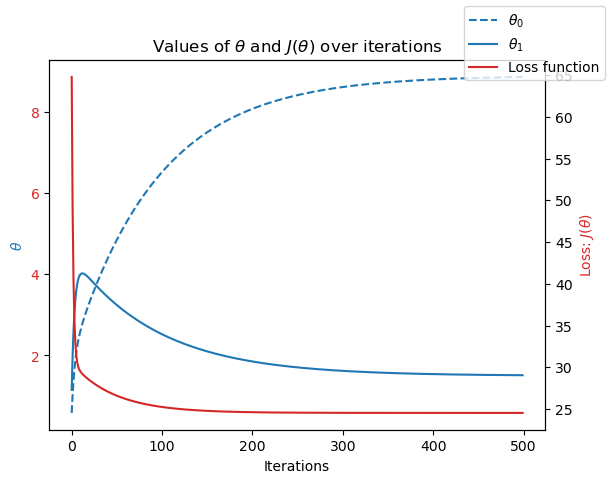

In [71]:
fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();

plt.show()

In [72]:
%%time
# theta range
theta0_vals = np.linspace(.2,-.02,100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(0,.15,100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: total: 4.25 s
Wall time: 4.96 s


In [73]:
fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [361]:
line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

## Madrid

### 1960

In [77]:
madrid= climate[['DATE', 'MONTH','MADRID_cloud_cover','MADRID_wind_speed','MADRID_humidity','MADRID_pressure',
        'MADRID_global_radiation','MADRID_precipitation','MADRID_sunshine',
      'MADRID_sunshine', 'MADRID_temp_mean', 'MADRID_temp_min','MADRID_temp_max']].copy()

In [78]:
madrid['DATE'] = pd.to_datetime(madrid['DATE'].astype(str), format='%Y%m%d', errors='coerce')

In [79]:
notempmad = madrid.drop(['DATE','MONTH'], axis=1)

In [80]:
notempmad.boxplot(figsize=(15,15))
plt.xticks(rotation=90)

(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 [Text(1, 0, 'MADRID_cloud_cover'),
  Text(2, 0, 'MADRID_wind_speed'),
  Text(3, 0, 'MADRID_humidity'),
  Text(4, 0, 'MADRID_pressure'),
  Text(5, 0, 'MADRID_global_radiation'),
  Text(6, 0, 'MADRID_precipitation'),
  Text(7, 0, 'MADRID_sunshine'),
  Text(8, 0, 'MADRID_sunshine'),
  Text(9, 0, 'MADRID_temp_mean'),
  Text(10, 0, 'MADRID_temp_min'),
  Text(11, 0, 'MADRID_temp_max')])

In [81]:
madridyear = madrid[madrid['DATE'].astype(str).str.contains('1960')] #<-----INSERT YEAR HERE\n",
madridyear

,DATE,MONTH,MADRID_cloud_cover,MADRID_wind_speed,MADRID_humidity,MADRID_pressure,MADRID_global_radiation,MADRID_precipitation,MADRID_sunshine,MADRID_sunshine,MADRID_temp_mean,MADRID_temp_min,MADRID_temp_max
0,1960-01-01,1,6,0.0,0.92,1.0260,0.53,0.00,1.4,1.4,7.6,4.4,10.8
1,1960-01-02,1,7,0.8,0.86,1.0254,0.46,0.00,0.9,0.9,9.8,7.4,12.2
2,1960-01-03,1,5,1.9,0.90,1.0287,0.63,0.00,2.3,2.3,8.6,6.4,10.8
3,1960-01-04,1,0,1.1,0.75,1.0281,1.16,0.00,8.7,8.7,10.3,4.5,16.1
4,1960-01-05,1,2,1.1,0.64,1.0269,1.10,0.00,7.8,7.8,12.1,8.2,16.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
361,1960-12-27,12,4,3.9,0.77,1.0170,0.80,0.05,4.3,4.3,7.0,3.6,10.4
362,1960-12-28,12,4,6.1,0.67,1.0223,1.02,0.10,7.1,7.1,5.0,2.5,7.5
363,1960-12-29,12,5,6.7,0.59,1.0239,0.49,0.00,1.1,1.1,8.1,5.6,10.6
364,1960-12-30,12,5,4.4,0.66,1.0245,1.07,0.00,7.6,7.6,9.2,6.4,12.0


In [82]:
madridyear.describe()

,DATE,MONTH,MADRID_cloud_cover,MADRID_wind_speed,MADRID_humidity,MADRID_pressure,MADRID_global_radiation,MADRID_precipitation,MADRID_sunshine,MADRID_sunshine,MADRID_temp_mean,MADRID_temp_min,MADRID_temp_max
count,366,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000
mean,1960-07-01 12:00:00,6.513661,4.377049,2.435246,0.612514,1.015860,1.924426,0.161284,7.398087,7.398087,13.963934,9.503005,18.425137
min,1960-01-01 00:00:00,1.000000,0.000000,0.000000,0.230000,0.996800,0.280000,0.000000,0.000000,0.000000,-2.300000,-5.000000,0.400000
25%,1960-04-01 06:00:00,4.000000,2.000000,1.100000,0.440000,1.012425,0.940000,0.000000,3.025000,3.025000,8.325000,5.200000,11.000000
50%,1960-07-01 12:00:00,7.000000,5.000000,2.200000,0.620000,1.015700,1.850000,0.000000,8.150000,8.150000,12.750000,8.600000,17.300000
75%,1960-09-30 18:00:00,9.750000,7.000000,3.900000,0.790000,1.019300,2.987500,0.047500,11.400000,11.400000,20.775000,15.000000,26.375000
max,1960-12-31 00:00:00,12.000000,8.000000,7.200000,0.950000,1.033500,3.690000,2.930000,14.500000,14.500000,29.300000,23.000000,36.000000
std,NaN,3.455958,2.610814,1.687566,0.192780,0.006324,1.096405,0.413395,4.652455,4.652455,7.267478,6.076969,8.662593


In [83]:
notempyearmad = madridyear.drop(['DATE','MONTH'], axis=1)

In [84]:
fig = go.Figure(data=[go.Surface(z=notempyearmad.values)])
fig.update_layout(title='Temperatures over time', autosize=False,
                     width=600, height=600)
fig.show()

In [85]:
i = np.arange(0.01,3.67,0.01) #<---needs to be one GREATER than the total number of days\n",
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
361,3.62
362,3.63
363,3.64
364,3.65


In [86]:
n_rowsmad = madridyear.shape[0]
n_rowsmad

366

In [87]:
X=index.to_numpy().reshape(n_rowsmad,1)
ones = np.ones((n_rowsmad,1))
X = np.concatenate((ones, X), axis=1)
y=madridyear['MADRID_temp_mean'].to_numpy().reshape(n_rowsmad,1)

In [88]:
X.shape, y.shape

((366, 2), (366, 1))

In [89]:
plt.scatter(x=index['index'], y=madridyear['MADRID_temp_mean']) #<----INSERT WEATHER STATION HERE\n",
plt.xlabel('X'); plt.ylabel('y');
plt.title('Input dataset');

In [90]:
madridyear['MADRID_temp_mean'].min()

-2.3

In [91]:
madridyear['MADRID_temp_mean'].max()

29.3

In [92]:
compute_cost(X,y)

array([123.83169399])

In [93]:
%%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=500 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[0],[0]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.05 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: total: 625 ms
Wall time: 616 ms


In [94]:
theta

array([[12.61526958],
       [ 0.7290862 ]])

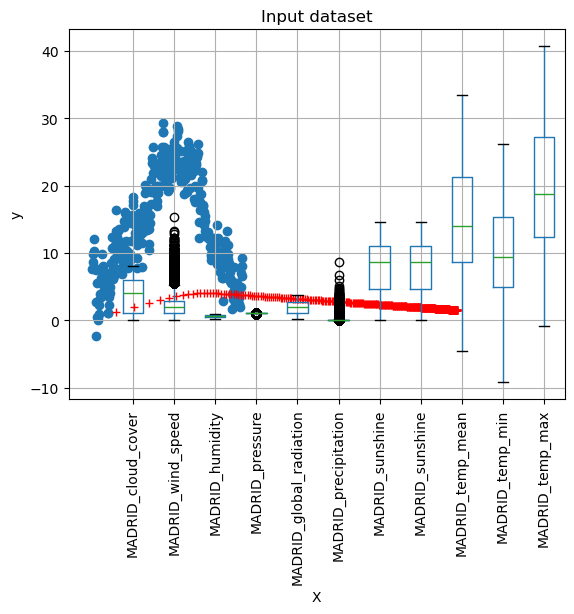

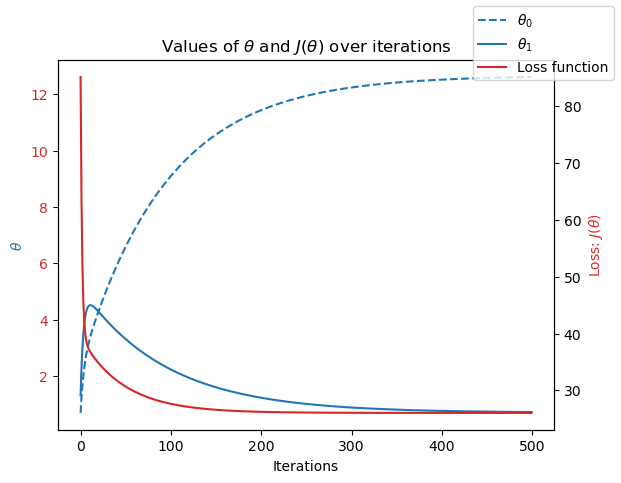

In [95]:
fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();

plt.show()

In [96]:
%%time
# theta range
theta0_vals = np.linspace(-.3,0,100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(0,.1,100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: total: 2.81 s
Wall time: 2.93 s


In [97]:
fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [98]:
line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

### 1990

In [100]:
madridyear90 = madrid[madrid['DATE'].astype(str).str.contains('1990')] #<-----INSERT YEAR HERE\n",
madridyear90

,DATE,MONTH,MADRID_cloud_cover,MADRID_wind_speed,MADRID_humidity,MADRID_pressure,MADRID_global_radiation,MADRID_precipitation,MADRID_sunshine,MADRID_sunshine,MADRID_temp_mean,MADRID_temp_min,MADRID_temp_max
10958,1990-01-01,1,8,0.0,0.96,1.0215,0.29,0.65,0.0,0.0,7.7,7.0,8.4
10959,1990-01-02,1,8,1.1,0.90,1.0232,0.29,0.50,0.0,0.0,6.5,5.6,7.4
10960,1990-01-03,1,7,1.1,0.87,1.0128,0.41,0.07,0.5,0.5,7.0,4.9,9.0
10961,1990-01-04,1,4,1.1,0.72,1.0239,0.99,0.00,6.4,6.4,6.5,2.5,10.5
10962,1990-01-05,1,1,1.1,0.77,1.0303,1.08,0.00,7.5,7.5,6.9,3.4,10.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
11318,1990-12-27,12,6,1.7,0.86,1.0249,0.31,0.00,0.0,0.0,8.7,6.2,11.2
11319,1990-12-28,12,8,1.4,0.90,1.0284,0.39,0.09,0.2,0.2,8.2,6.4,10.0
11320,1990-12-29,12,8,0.8,0.95,1.0281,0.20,0.10,0.0,0.0,8.6,7.8,9.4
11321,1990-12-30,12,8,0.3,0.95,1.0290,0.25,0.02,0.0,0.0,8.3,7.4,9.2


In [101]:
notempyearmad90 = madridyear90.drop(['DATE','MONTH'], axis=1)

In [102]:
fig = go.Figure(data=[go.Surface(z=notempyearmad90.values)])
fig.update_layout(title='Temperatures over time', autosize=False,
                     width=600, height=600)
fig.show()

In [103]:
i = np.arange(0.01,3.66,0.01) #<---needs to be one GREATER than the total number of days\n",
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
360,3.61
361,3.62
362,3.63
363,3.64


In [104]:
n_rowsmad90 = madridyear90.shape[0]
n_rowsmad90

365

In [105]:
X=index.to_numpy().reshape(n_rowsmad90,1)
ones = np.ones((n_rowsmad90,1))
X = np.concatenate((ones, X), axis=1)
y=madridyear90['MADRID_temp_mean'].to_numpy().reshape(n_rowsmad90,1)

In [106]:
X.shape, y.shape

((365, 2), (365, 1))

In [107]:
plt.scatter(x=index['index'], y=madridyear90['MADRID_temp_mean']) #<----INSERT WEATHER STATION HERE\n",
plt.xlabel('X'); plt.ylabel('y');
plt.title('Input dataset');

In [108]:
madridyear90['MADRID_temp_mean'].min()

2.0

In [109]:
madridyear90['MADRID_temp_mean'].max()

31.0

In [110]:
compute_cost(X,y)

array([147.39923288])

In [111]:
%%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=500 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[0],[0]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.02 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: total: 391 ms
Wall time: 405 ms


In [112]:
theta

array([[12.5273332 ],
       [ 1.41396424]])

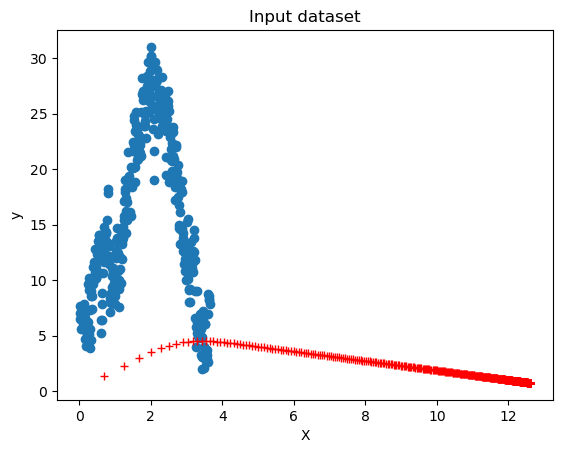

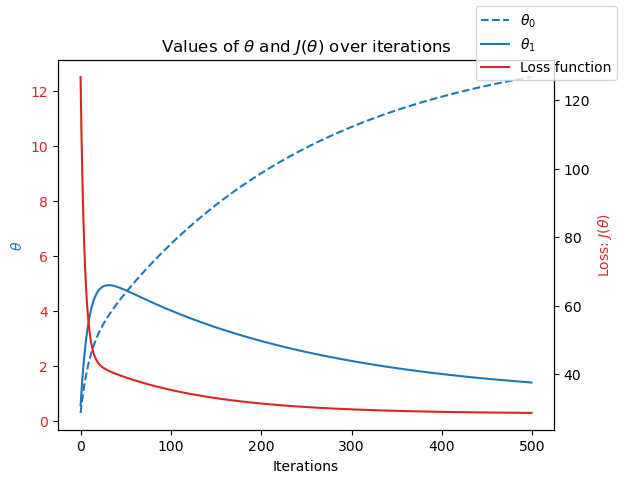

In [113]:
fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();

plt.show()

In [114]:
%%time
# theta range
theta0_vals = np.linspace(-.1,0,100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(.05,.1,100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: total: 2.73 s
Wall time: 2.99 s


In [115]:
fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

In [116]:
line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

### 2020

In [118]:
madridyear20 = madrid[madrid['DATE'].astype(str).str.contains('2020')] #<-----INSERT YEAR HERE\n",
madridyear20

,DATE,MONTH,MADRID_cloud_cover,MADRID_wind_speed,MADRID_humidity,MADRID_pressure,MADRID_global_radiation,MADRID_precipitation,MADRID_sunshine,MADRID_sunshine,MADRID_temp_mean,MADRID_temp_min,MADRID_temp_max
21915,2020-01-01,1,1,0.3,0.68,1.0326,1.12,0.00,8.7,8.7,6.6,1.9,11.2
21916,2020-01-02,1,1,0.6,0.77,1.0321,1.12,0.00,8.3,8.3,6.0,1.6,10.5
21917,2020-01-03,1,6,0.8,0.81,1.0344,1.10,0.00,1.4,1.4,3.8,1.5,6.0
21918,2020-01-04,1,0,2.5,0.62,1.0339,0.51,0.00,8.9,8.9,7.0,2.8,11.2
21919,2020-01-05,1,0,1.1,0.54,1.0304,1.15,0.00,8.6,8.6,6.2,1.5,10.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...
22276,2020-12-27,12,5,3.9,0.73,1.0153,0.72,0.22,3.3,3.3,2.8,-1.3,6.9
22277,2020-12-28,12,2,8.1,0.62,1.0043,1.05,0.01,7.5,7.5,5.7,2.9,8.5
22278,2020-12-29,12,4,4.4,0.70,1.0079,0.85,0.00,4.8,4.8,4.5,0.8,8.2
22279,2020-12-30,12,1,3.1,0.59,1.0189,1.06,0.00,7.5,7.5,4.8,1.2,8.4


In [119]:
notempyearmad20 = madridyear20.drop(['DATE','MONTH'], axis=1)

In [120]:
fig = go.Figure(data=[go.Surface(z=notempyearmad20.values)])
fig.update_layout(title='Temperatures over time', autosize=False,
                     width=600, height=600)
fig.show()

In [121]:
i = np.arange(0.01,3.67,0.01) #<---needs to be one GREATER than the total number of days\n",
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
361,3.62
362,3.63
363,3.64
364,3.65


In [122]:
n_rowsmad20 = madridyear20.shape[0]
n_rowsmad20

366

In [123]:
X=index.to_numpy().reshape(n_rowsmad20,1)
ones = np.ones((n_rowsmad20,1))
X = np.concatenate((ones, X), axis=1)
y=madridyear20['MADRID_temp_mean'].to_numpy().reshape(n_rowsmad20,1)

In [124]:
X.shape, y.shape

((366, 2), (366, 1))

In [125]:
plt.scatter(x=index['index'], y=madridyear20['MADRID_temp_mean']) #<----INSERT WEATHER STATION HERE\n",
plt.xlabel('X'); plt.ylabel('y');
plt.title('Input dataset');

In [126]:
madridyear20['MADRID_temp_mean'].min()

2.8

In [127]:
madridyear20['MADRID_temp_mean'].max()

32.2

In [128]:
compute_cost(X,y)

array([155.78495902])

In [129]:
%%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=500 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[0],[0]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.01 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: total: 672 ms
Wall time: 798 ms


In [130]:
theta

array([[10.28945967],
       [ 2.64440922]])

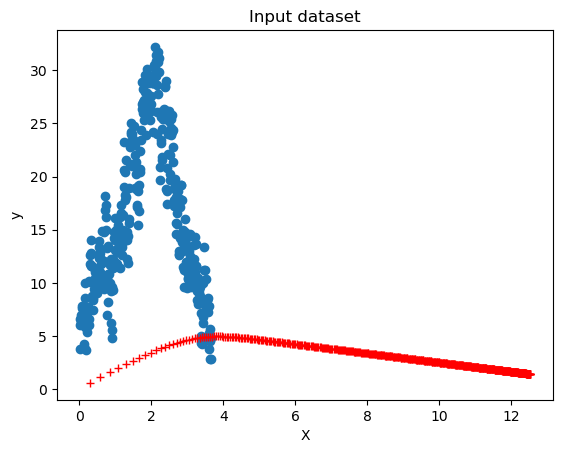

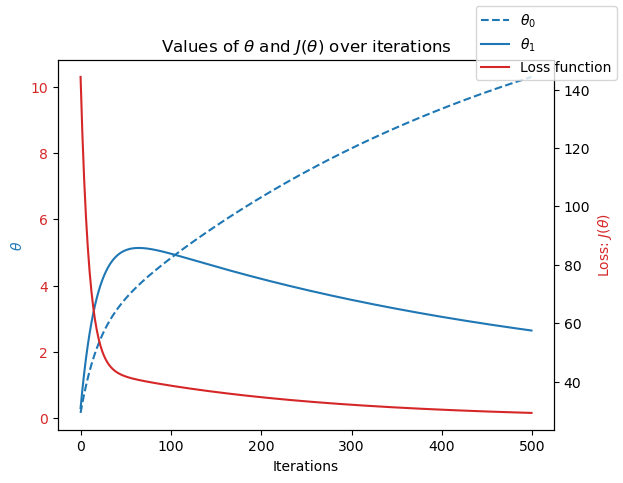

In [131]:
fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();

plt.show()

In [132]:
fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

## Stockholm

### 1960

In [135]:
stockholm = climate[['DATE', 'MONTH','STOCKHOLM_cloud_cover','STOCKHOLM_pressure',
    'STOCKHOLM_global_radiation','STOCKHOLM_precipitation','STOCKHOLM_sunshine',
    'STOCKHOLM_sunshine', 'STOCKHOLM_temp_mean', 'STOCKHOLM_temp_min','STOCKHOLM_temp_max']].copy()

In [136]:
stockholm['DATE'] = pd.to_datetime(stockholm['DATE'].astype(str), format='%Y%m%d', errors='coerce')

In [137]:
notempstock = stockholm.drop(['DATE', 'MONTH'], axis = 1)

In [138]:
notempstock.boxplot(figsize=(15,15))
plt.xticks(rotation=90)

(array([1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(1, 0, 'STOCKHOLM_cloud_cover'),
  Text(2, 0, 'STOCKHOLM_pressure'),
  Text(3, 0, 'STOCKHOLM_global_radiation'),
  Text(4, 0, 'STOCKHOLM_precipitation'),
  Text(5, 0, 'STOCKHOLM_sunshine'),
  Text(6, 0, 'STOCKHOLM_sunshine'),
  Text(7, 0, 'STOCKHOLM_temp_mean'),
  Text(8, 0, 'STOCKHOLM_temp_min'),
  Text(9, 0, 'STOCKHOLM_temp_max')])

In [139]:
stockholm1960 = stockholm[stockholm['DATE'].astype(str).str.contains('1960')]
stockholm1960

,DATE,MONTH,STOCKHOLM_cloud_cover,STOCKHOLM_pressure,STOCKHOLM_global_radiation,STOCKHOLM_precipitation,STOCKHOLM_sunshine,STOCKHOLM_sunshine,STOCKHOLM_temp_mean,STOCKHOLM_temp_min,STOCKHOLM_temp_max
0,1960-01-01,1,5,1.0114,0.05,0.32,0.0,0.0,4.2,2.2,4.9
1,1960-01-02,1,5,1.0114,0.05,0.06,0.0,0.0,4.0,3.0,5.0
2,1960-01-03,1,5,1.0114,0.05,0.02,0.0,0.0,2.4,1.3,4.1
3,1960-01-04,1,5,1.0114,0.05,0.00,0.0,0.0,1.2,0.4,2.3
4,1960-01-05,1,5,1.0114,0.05,1.32,0.0,0.0,3.3,0.8,4.3
...,...,...,...,...,...,...,...,...,...,...,...
361,1960-12-27,12,5,1.0114,0.05,0.15,0.0,0.0,4.1,3.6,4.4
362,1960-12-28,12,5,1.0114,0.05,0.00,0.0,0.0,2.8,1.5,3.8
363,1960-12-29,12,5,1.0114,0.05,0.13,0.0,0.0,2.4,1.5,3.9
364,1960-12-30,12,5,1.0114,0.05,0.16,0.0,0.0,1.5,0.6,2.5


In [140]:
stocknoyear = stockholm1960.drop(['DATE','MONTH'], axis=1)

In [141]:
fig = go.Figure(data=[go.Surface(z=stocknoyear.values)])
fig.update_layout(title='Temperature data ', autosize=False,
                     width=600, height=600)

In [142]:
i = np.arange(0.01,3.67,0.01) #<---needs to be one GREATER than the total number of days\n",
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
361,3.62
362,3.63
363,3.64
364,3.65


In [143]:
stock_rows = stocknoyear.shape[0]
stock_rows

366

In [144]:
X=index.to_numpy().reshape(stock_rows,1)
ones = np.ones((stock_rows,1))
X = np.concatenate((ones, X), axis=1)
y=stockholm1960['STOCKHOLM_temp_mean'].to_numpy().reshape(stock_rows,1)

In [145]:
plt.scatter(x=index['index'], y=stockholm1960['STOCKHOLM_temp_mean'])
plt.xlabel('X'); plt.ylabel('y');
plt.title('Input dataset');

In [146]:
stockholm1960['STOCKHOLM_temp_mean'].min()

-11.6

In [147]:
stockholm1960['STOCKHOLM_temp_mean'].max()

20.9

In [148]:
compute_cost(X,y)

array([53.25801913])

In [149]:
%%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=300 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[0],[0]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.01 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: total: 250 ms
Wall time: 253 ms


In [150]:
theta

array([[1.5151394 ],
       [2.73227381]])

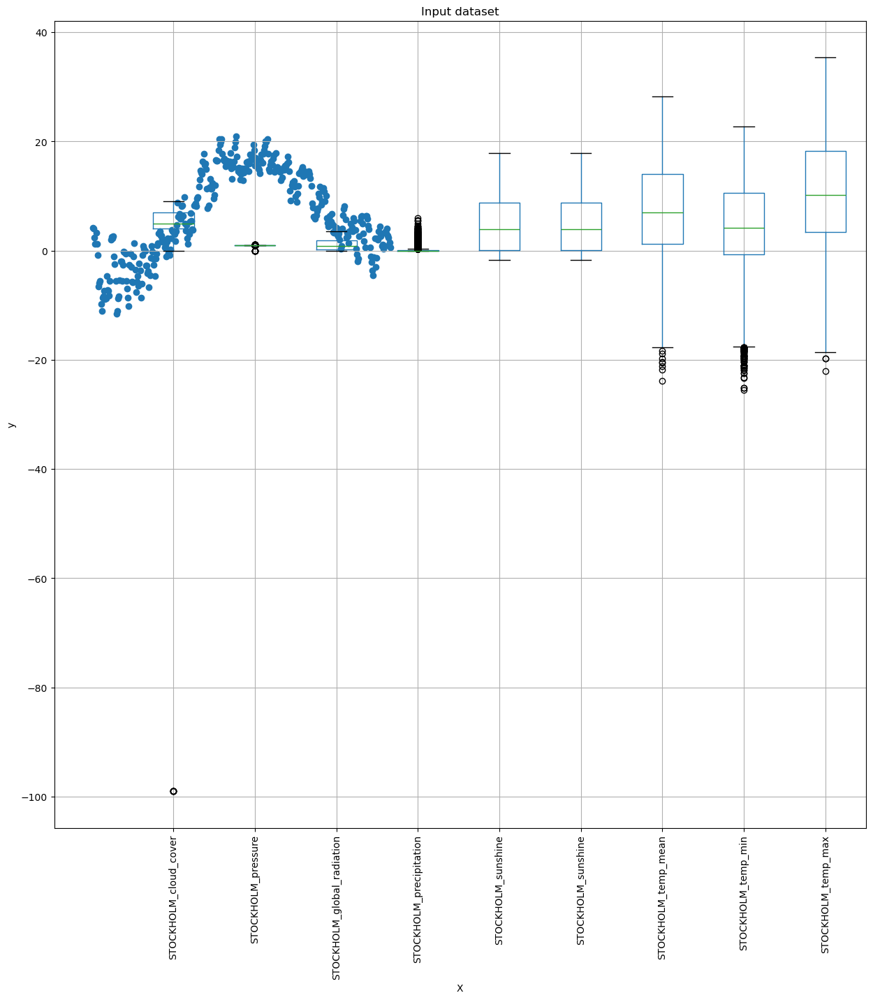

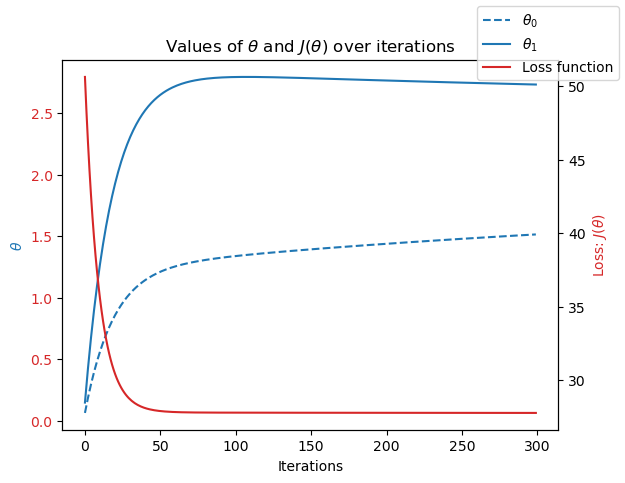

In [151]:
fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();

plt.show()

In [152]:
%%time
# theta range
theta0_vals = np.linspace(10,-10.6,100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(-10,10.25,100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: total: 2.92 s
Wall time: 3.05 s


In [153]:
fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

### 1990

In [155]:
stockholm1990 = stockholm[stockholm['DATE'].astype(str).str.contains('1990')]
stockholm1990

,DATE,MONTH,STOCKHOLM_cloud_cover,STOCKHOLM_pressure,STOCKHOLM_global_radiation,STOCKHOLM_precipitation,STOCKHOLM_sunshine,STOCKHOLM_sunshine,STOCKHOLM_temp_mean,STOCKHOLM_temp_min,STOCKHOLM_temp_max
10958,1990-01-01,1,6,1.0220,0.13,0.00,1.9,1.9,-2.9,-4.2,-0.3
10959,1990-01-02,1,8,1.0229,0.05,0.01,0.0,0.0,-4.3,-5.0,-3.4
10960,1990-01-03,1,8,1.0282,0.05,0.00,0.0,0.0,-3.6,-4.9,-2.6
10961,1990-01-04,1,8,1.0254,0.05,0.00,0.0,0.0,-0.2,-2.6,0.5
10962,1990-01-05,1,8,1.0200,0.05,0.00,0.0,0.0,-0.4,-0.8,0.8
...,...,...,...,...,...,...,...,...,...,...,...
11318,1990-12-27,12,8,0.9800,0.05,0.36,0.0,0.0,3.7,2.5,4.9
11319,1990-12-28,12,2,0.9941,0.10,0.00,1.1,1.1,2.2,1.2,5.0
11320,1990-12-29,12,8,0.9899,0.05,0.59,0.0,0.0,2.8,0.1,3.8
11321,1990-12-30,12,6,0.9927,0.13,0.00,2.3,2.3,2.5,1.7,3.6


In [156]:
stocknoyear90 = stockholm1990.drop(['DATE','MONTH'], axis=1)

In [157]:
fig = go.Figure(data=[go.Surface(z=stocknoyear.values)])
fig.update_layout(title='Temperature data ', autosize=False,
                     width=600, height=600)

In [158]:
i = np.arange(0.01,3.66,0.01) #<---needs to be one GREATER than the total number of days\n",
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
360,3.61
361,3.62
362,3.63
363,3.64


In [159]:
stock_rows90 = stocknoyear90.shape[0]
stock_rows90

365

In [160]:
X=index.to_numpy().reshape(stock_rows90,1)
ones = np.ones((stock_rows90,1))
X = np.concatenate((ones, X), axis=1)
y=stockholm1990['STOCKHOLM_temp_mean'].to_numpy().reshape(stock_rows90,1)

In [161]:
plt.scatter(x=index['index'], y=stockholm1990['STOCKHOLM_temp_mean'])
plt.xlabel('X'); plt.ylabel('y');
plt.title('Input dataset');

In [162]:
stockholm1990['STOCKHOLM_temp_mean'].min()

-5.3

In [163]:
stockholm1990['STOCKHOLM_temp_mean'].max()

23.3

In [164]:
compute_cost(X,y)

array([55.36439726])

In [165]:
%%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=100 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[0],[0]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.01 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: total: 109 ms
Wall time: 115 ms


In [166]:
theta

array([[2.56624313],
       [2.56750667]])

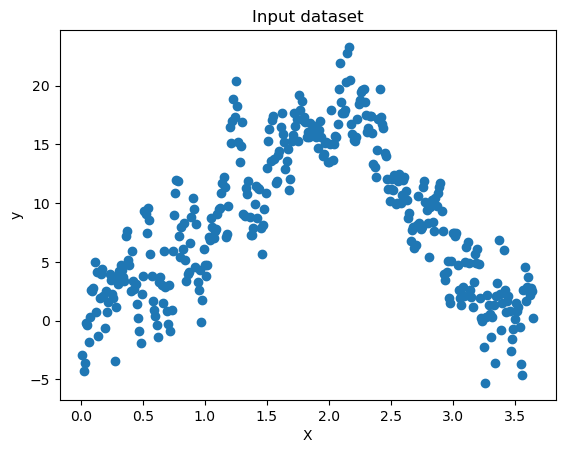

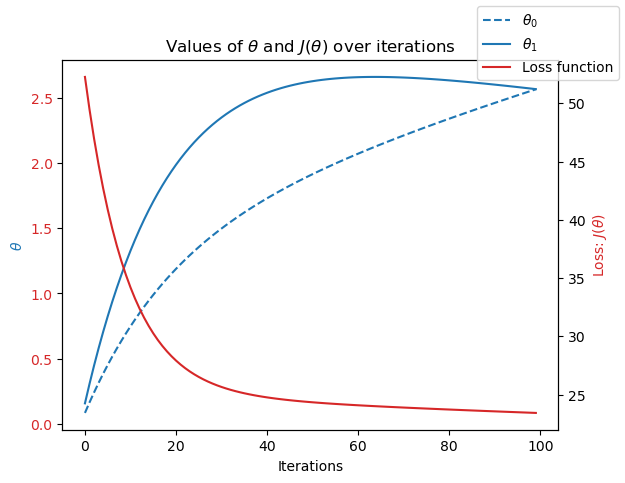

In [167]:
fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();

plt.show()

In [168]:
%%time
# theta range
theta0_vals = np.linspace(-9.98,10.02,100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(-9.95,.05,100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: total: 3.3 s
Wall time: 3.44 s


In [169]:
fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

### 2020

In [171]:
stockholm2020 = stockholm[stockholm['DATE'].astype(str).str.contains('2020')]
stockholm2020

,DATE,MONTH,STOCKHOLM_cloud_cover,STOCKHOLM_pressure,STOCKHOLM_global_radiation,STOCKHOLM_precipitation,STOCKHOLM_sunshine,STOCKHOLM_sunshine,STOCKHOLM_temp_mean,STOCKHOLM_temp_min,STOCKHOLM_temp_max
21915,2020-01-01,1,5,1.0125,1.11,0.00,0.0,0.0,3.5,1.2,5.2
21916,2020-01-02,1,5,1.0068,1.11,0.00,0.4,0.4,5.8,5.0,6.8
21917,2020-01-03,1,5,0.9958,1.11,0.00,0.3,0.3,5.4,4.3,8.3
21918,2020-01-04,1,5,0.9997,1.11,0.00,3.5,3.5,2.4,1.6,4.4
21919,2020-01-05,1,5,1.0186,1.11,0.30,2.5,2.5,0.1,-1.5,1.9
...,...,...,...,...,...,...,...,...,...,...,...
22276,2020-12-27,12,5,0.9947,0.05,0.02,0.0,0.0,4.2,0.3,5.3
22277,2020-12-28,12,5,0.9952,0.05,0.71,0.0,0.0,4.2,3.4,4.8
22278,2020-12-29,12,5,0.9934,0.05,0.35,0.0,0.0,4.4,2.7,5.6
22279,2020-12-30,12,5,0.9964,0.05,0.28,0.0,0.0,2.8,1.1,4.4


In [172]:
stocknoyear20 = stockholm2020.drop(['DATE','MONTH'], axis=1)

In [173]:
fig = go.Figure(data=[go.Surface(z=stocknoyear.values)])
fig.update_layout(title='Temperature data ', autosize=False,
                     width=600, height=600)

In [174]:
i = np.arange(0.01,3.67,0.01) #<---needs to be one GREATER than the total number of days\n",
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
361,3.62
362,3.63
363,3.64
364,3.65


In [175]:
stock_rows20 = stocknoyear20.shape[0]
stock_rows20

366

In [176]:
X=index.to_numpy().reshape(stock_rows20,1)
ones = np.ones((stock_rows20,1))
X = np.concatenate((ones, X), axis=1)
y=stockholm2020['STOCKHOLM_temp_mean'].to_numpy().reshape(stock_rows20,1)

In [177]:
plt.scatter(x=index['index'], y=stockholm2020['STOCKHOLM_temp_mean'])
plt.xlabel('X'); plt.ylabel('y');
plt.title('Input dataset');

In [178]:
stockholm2020['STOCKHOLM_temp_mean'].min()

-1.3

In [179]:
stockholm2020['STOCKHOLM_temp_mean'].max()

24.7

In [180]:
compute_cost(X,y)

array([67.30819672])

In [181]:
%%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=150 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[0],[0]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.01 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: total: 234 ms
Wall time: 238 ms


In [182]:
theta

array([[3.06642244],
       [3.18305799]])

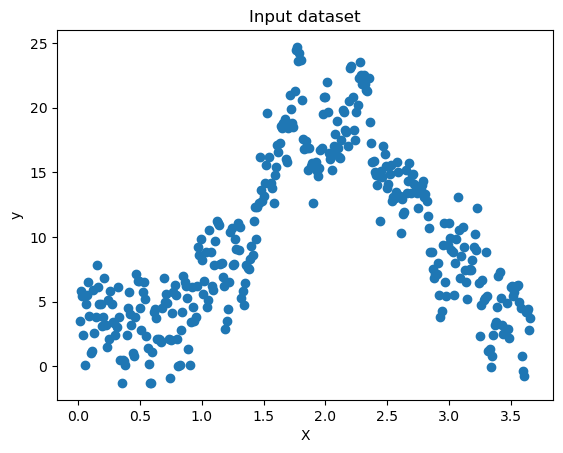

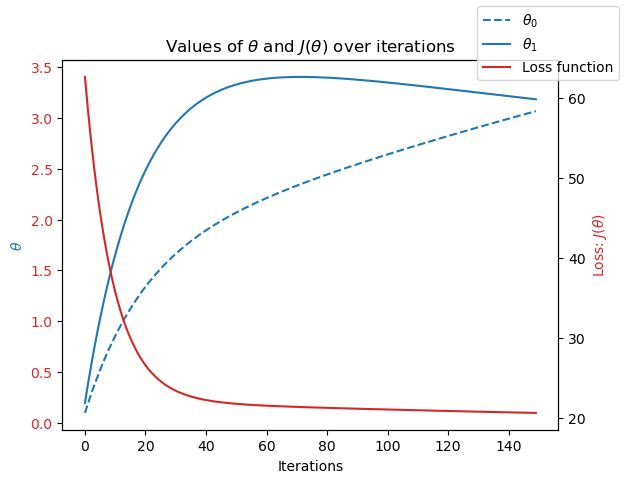

In [183]:
fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend();

plt.show()

In [184]:
fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()